In [ ]:
# !python -m pip install pyyaml==5.1
# # Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# # so we install from source instead. This takes a few minutes.
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# # Install pre-built detectron2 that matches pytorch version, if released:
# # See https://detectron2.readthedocs.io/tutorials/install.html for instructions
# #!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# # exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
!git clone https://github.com/fcakyon/small-object-detection-benchmark

Cloning into 'small-object-detection-benchmark'...
remote: Enumerating objects: 328, done.
remote: Counting objects: 100% (144/144), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 328 (delta 133), reused 123 (delta 123), pack-reused 184
Receiving objects: 100% (328/328), 71.57 KiB | 6.51 MiB/s, done.
Resolving deltas: 100% (201/201), done.


In [ ]:
# !gdown --id 1a2oHjcEcwXP8oUF95qiwrqzACb2YlUhn
# !gdown --id 1bxK5zgLn0_L8x276eKkuYA_FzwCIjb59
# !gdown --id 1PFdW_VFSCfZ_sTSZAGjQdifF_Xd5mf0V
# !gdown --id 1KN8R3oioOvSXH492GEVk-Hx74nWHAcXT


In [ ]:
# !unzip /content/VisDrone2019-DET-test-challenge.zip -d /content
# !unzip /content/VisDrone2019-DET-test-dev.zip -d /content
# !unzip /content/VisDrone2019-DET-train.zip -d /content
# !unzip /content/VisDrone2019-DET-val.zip -d /content

In [ ]:
# !mv /content/annotations /content/VisDrone2019-DET-test-dev
# !mv /content/images /content/VisDrone2019-DET-test-dev

In [ ]:
!pip install fire

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 87 kB 3.6 MB/s 
  Created wheel for fire: filename=fire-0.4.0-py2.py3-none-any.whl size=115942 sha256=bd7b9178b9be65d3b8df7fbc496b5f7a1f243e8e2b866f00756d9829630dd9aa
  Stored in directory: /root/.cache/pip/wheels/8a/67/fb/2e8a12fa16661b9d5af1f654bd199366799740a85c64981226
Successfully built fire


In [ ]:
!pip install sahi>=0.8.22

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires click<8.0,>=5.1, but you have click 8.0.4 which is incompatible.


In [ ]:
# !pip install -r /content/small-object-detection-benchmark/requirements.txt

In [ ]:
# !python /content/small-object-detection-benchmark/visdrone/visdrone_to_coco.py /content/VisDrone2019-DET-train /content/annotations.txt
!python /content/small-object-detection-benchmark/visdrone/visdrone_to_coco.py /content/VisDrone2019-DET-train /content/annotations.json
!python /content/small-object-detection-benchmark/visdrone/visdrone_to_coco.py /content/VisDrone2019-DET-val /content/val_annotations.json

100% 6471/6471 [00:35<00:00, 184.79it/s]
100% 548/548 [00:03<00:00, 182.52it/s]


In [ ]:
# !cat -n 10 /content/annotations.txt

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("visdrone_train_new", {}, "/content/annotations.json", "/content/VisDrone2019-DET-train/")
register_coco_instances("visdrone_val_new", {}, "/content/val_annotations.json", "/content/VisDrone2019-DET-val/")

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("visdrone_train_new")
# cfg.DATASETS.TEST = ("visdrone_val_new")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 3000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/28 11:12:19 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (11, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (11,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (40, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (40,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias

[05/28 11:12:26 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/28 11:12:59 d2.utils.events]:  eta: 1:18:49  iter: 19  total_loss: 4.521  loss_cls: 2.48  loss_box_reg: 0.6675  loss_rpn_cls: 1.062  loss_rpn_loc: 0.311  time: 1.6110  data_time: 0.0281  lr: 4.9953e-06  max_mem: 7611M
[05/28 11:13:36 d2.utils.events]:  eta: 1:25:22  iter: 39  total_loss: 3.642  loss_cls: 2.404  loss_box_reg: 0.6735  loss_rpn_cls: 0.2119  loss_rpn_loc: 0.2993  time: 1.7165  data_time: 0.0081  lr: 9.9902e-06  max_mem: 7611M
[05/28 11:14:12 d2.utils.events]:  eta: 1:27:08  iter: 59  total_loss: 3.483  loss_cls: 2.246  loss_box_reg: 0.6888  loss_rpn_cls: 0.2271  loss_rpn_loc: 0.3025  time: 1.7574  data_time: 0.0077  lr: 1.4985e-05  max_mem: 7611M
[05/28 11:14:46 d2.utils.events]:  eta: 1:26:23  iter: 79  total_loss: 3.29  loss_cls: 2.024  loss_box_reg: 0.7352  loss_rpn_cls: 0.1479  loss_rpn_loc: 0.3593  time: 1.7424  data_time: 0.0077  lr: 1.998e-05  max_mem: 7611M
[05/28 11:15:21 d2.utils.events]:  eta: 1:25:34  iter: 99  total_loss: 2.946  loss_cls: 1.709  loss_box_r

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

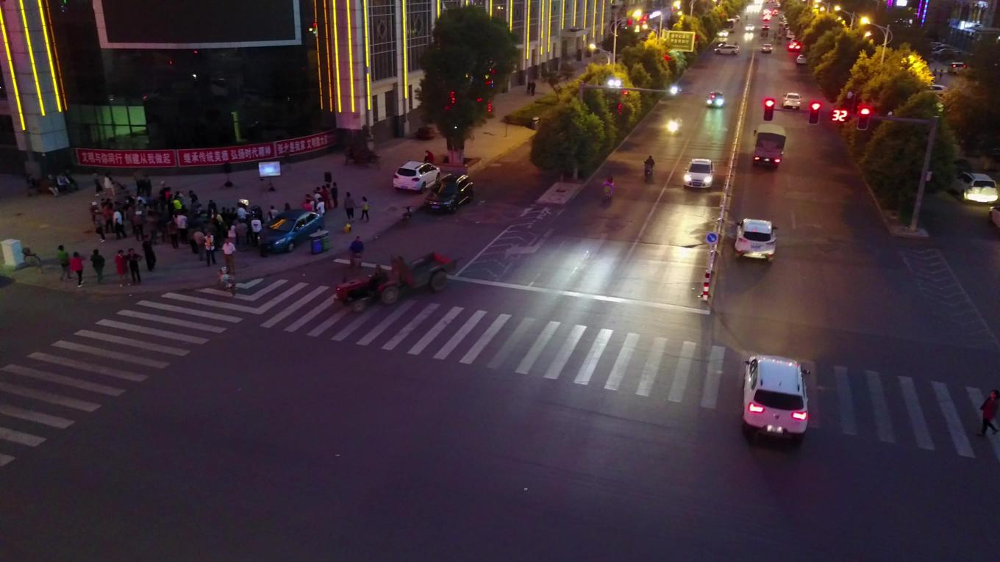

In [ ]:
im = cv2.imread("/content/VisDrone2019-DET-test-dev/images/0000120_02001_d_0000096.jpg")
cv2_imshow(im)

In [ ]:
outputs = predictor(im)
outputs["instances"].pred_classes, outputs["instances"].pred_boxes

(tensor([3, 3, 3, 3, 3, 3, 0, 3, 3, 0, 0, 0, 0, 0, 3, 0, 3, 0, 0, 0, 3, 0, 3, 3,
         3, 0, 3, 0, 9, 0, 3, 0, 0, 1, 3, 0, 0, 0, 0, 0, 3, 0, 9, 3, 0, 0, 3, 0,
         0, 3, 0, 3], device='cuda:0'),
 Boxes(tensor([[ 960.6300,  121.3720,  985.5693,  147.3262],
         [ 928.3633,  213.6080,  973.4584,  258.6988],
         [ 970.5829,   56.9660, 1006.8865,   74.8653],
         [1006.6371,  483.5770, 1103.3284,  603.7808],
         [ 533.4092,  216.9012,  603.5666,  261.6104],
         [ 579.2701,  234.6358,  645.8052,  290.6598],
         [ 171.7928,  339.1616,  194.4011,  387.3334],
         [ 352.5027,  285.8622,  443.5733,  346.3721],
         [1063.6129,  124.9838, 1091.7867,  150.4865],
         [  94.8989,  340.9117,  115.9478,  389.8089],
         [ 276.5865,  313.8985,  294.6160,  362.6868],
         [ 488.5599,  265.4050,  503.9463,  302.4020],
         [  75.7796,  331.4385,   96.0493,  383.5907],
         [ 467.3897,  260.0974,  483.5710,  302.4196],
         [1294.3934,  

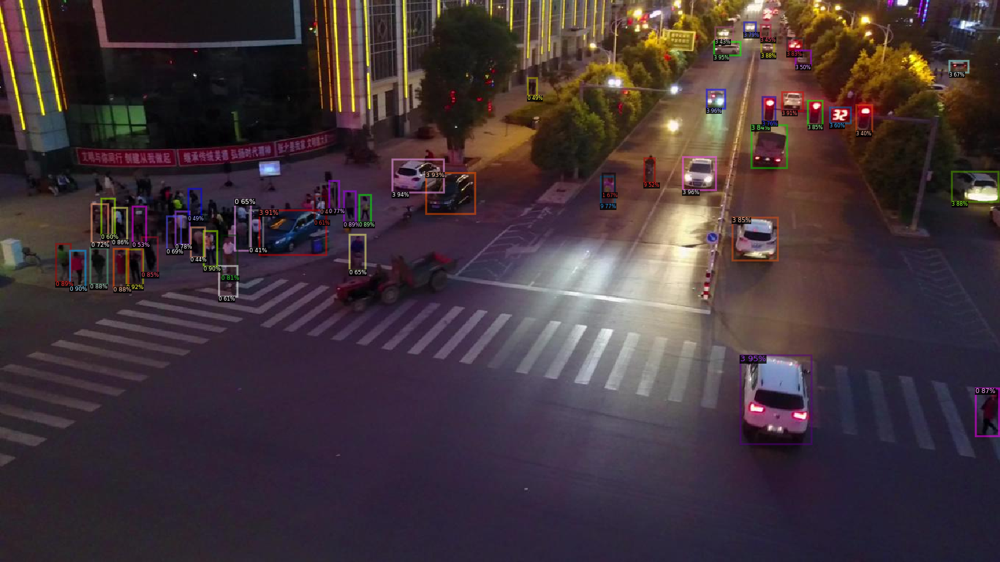

In [ ]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 971), started 0:39:49 ago. (Use '!kill 971' to kill it.)

<IPython.core.display.Javascript object>